In [1]:
import os
import tempfile
from pathlib import Path
import umap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import scvi
import torch
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
rcParams['figure.figsize'] = (12,12)

import muon as mu
import numpy as np
import pandas as pd
import scanpy as sc

from matplotlib import pyplot as plt
# import seaborn as sns
from scipy.sparse import csr_matrix as sparse

from muon import MuData
from muon import atac as ac

import matplotlib.patheffects as path_effects


In [2]:
l1_colors = {
'ATL': '#1f77b4',
  'PT_VCAM1': '#c5b0d5',
  'aPT': '#c5b0d5',
 'CNT': '#ff7f0e',
 'DCT': '#279e68',
  'DCT1': '#279e68',
 'DCT2': '#ffb500',
 'DTL': '#d62728',
 'EC': '#aa40fc',
 'ENDO': '#aa40fc',
 'FIB': '#8c564b',
 'IC': '#e377c2',
 'ICA': '#e377c2',
 'ica': '#e377c2',
 'icb': '#7b4f4b',
 'ICB': '#7b4f4b',
 'IMM': '#b5bd61',
 'LEUK': '#b5bd61',
 'NEU': '#17becf',
 'TL': '#ffb500',
 'PC': '#aec7e8',
 'pc': '#aec7e8',
 'PEC': '#17becf',
 'POD': '#98df8a',
 'PODO': '#98df8a',
'PT': '#ff9896',
 'PapE': '#c5b0d5',
 'TAL': '#c49c94',
'MES': '#f7b6d2',
 'VSM/P': '#f7b6d2',
 'VSM': '#f7b6d2',
 'Unclassified':'#d3d3d3'}

In [3]:
l3_colors = {
'ATL': '#ffff00',
 'B': '#1ce6ff',
 'C-TAL': '#ff34ff',
 'PC': '#aec7e8',
 'CCD-IC-A': '#ff4a46',
 'CCD-PC': '#008941',
 'CNT': '#006fa6',
 'CNT-IC-A': '#a30059',
 'CNT-PC': '#ffdbe5',
 'DCT1': '#7a4900',
 'DCT2': '#0000a6',
 'DTL': '#63ffac',
 'EC-AEA': '#b79762',
 'EC-AVR': '#004d43',
 'EC-DVR': '#8fb0ff',
 'EC-GC': '#997d87',
 'EC-LYM': '#5a0007',
 'EC-PTC': '#809693',
 'FIB': '#6a3a4c',
 'IC-B': '#1b4400',
 'IMCD': '#4fc601',
 'M-FIB': '#3b5dff',
 'M-TAL': '#4a3b53',
 'MAC-M2': '#ff2f80',
 'MAST': '#61615a',
 'MC': '#ba0900',
 'MD': '#6b7900',
 'MDC': '#00c2a0',
 'MYOF': '#ffaa92',
 'N': '#ff90c9',
 'NEU': '#b903aa',
 'NKC/T': '#d16100',
 'OMCD-IC-A': '#ddefff',
 'OMCD-PC': '#000035',
 'PEC': '#7b4f4b',
 'PL': '#a1c299',
 'POD': '#300018',
 'PT-S1/2': '#0aa6d8',
 'PT-S3': '#013349',
 'PapE': '#00846f',
 'REN': '#372101',
 'T': '#ffb500',
 'VSMC': '#c2ffed',
 'VSMC/P': '#a079bf',
 'aFIB': '#cc0744',
 'aPT': '#c0b9b2',
 'aTAL1': '#c2ff99',
 'aTAL2': '#001e09',
 'cDC': '#00489c',
 'cycCNT': '#6f0062',
 'cycDCT': '#0cbd66',
 'cycEC': '#eec3ff',
 'cycMNP': '#456d75',
 'cycMYOF': '#b77b68',
 'cycNKC/T': '#7a87a1',
 'cycPT': '#788d66',
 'dC-IC-A': '#885578',
 'dC-TAL': '#fad09f',
 'dCNT': '#ff8a9a',
 'dDCT': '#d157a0',
 'dEC': '#bec459',
 'dEC-PTC': '#456648',
 'dFIB': '#0086ed',
 'dIMCD': '#886f4c',
 'dM-FIB': '#34362d',
 'dM-TAL': '#b4a8bd',
 'dOMCD-PC': '#00a6aa',
 'dPT': '#452c2c',
 'dVSMC': '#636375',
 'ncMON': '#a3c8c9',
 'pDC': '#ff913f',
 'tPC-IC': '#938a81','Unclassified':'#d3d3d3'}

In [4]:
color_dict = {
    'Global RNA Horizontal': '#d62728',
    "scRNA 3' Horizontal": '#1f77b4',
    "scRNA 5' Horizontal": '#ff7f0e',
    'scMultiome-RNA Horizontal': '#2ca02c',
    'scMultiome-ATAC Horizontal': '#8c564b', 
    'scMultiome Vertical': '#9467bd',
    'Global Multimodal Mosaic': '#e377c2',
    'Global Multimodal Diagonal': '#17becf'
}

In [5]:
sample_list=['lib_55',
            'lib_09',
            'lib_16',
            'lib_420',
            'lib_20',
            'lib_51',
            'lib_03',
            'lib_15',
            'lib_19',
            'lib_56',
            'lib_10',
            'lib_34',
            'lib_57',
            'lib_29',
            'lib_36',
            'lib_68',
            'lib_49',
            'lib_38']

In [6]:
metadata = pd.read_excel('../CZI-HCA_PRECISE-samples_Metadata_110223.xlsx')
metadata = metadata.dropna()

In [7]:
index = [f'lib_{int(i)}' for i in metadata['precise_ID']]
index[0] = 'lib_09'
metadata.index = index
metadata['self_reported_ethnicityed_ethnicity'] = 'European'
metadata['tissue'] = [i+'_kidney' for i in metadata['Kidney']]

In [8]:
for sample in sample_list:
    if sample not in metadata.index:
        metadata.loc[sample]=None

In [9]:
cluster_metadata = pd.read_csv('../HORIZONTAL_RNA/csv/CLUSTERS_METADATA.csv', index_col=0)

In [10]:
kidney_cortex_cell_types = {
    'PT': {
        'full_name': 'Proximal Tubule Epithelial Cell',
        'ontology_term_id': 'CL:0000060'
    },
    'DCT': {
        'full_name': 'Distal Tubule Epithelial Cell',
        'ontology_term_id': 'CL:0000650'
    },
    'VSM/P': {
        'full_name': 'Vascular Smooth Muscle Cell / Pericyte',
        'ontology_term_id': 'CL:0000192'  # Vascular Smooth Muscle Cell
        # Note: Pericytes have a separate term: CL:0000669
    },
    'FIB': {
        'full_name': 'Fibroblast',
        'ontology_term_id': 'CL:0000057'
    },
    'PEC': {
        'full_name': 'Parietal Epithelial Cell',
        'ontology_term_id': 'CL:1000488'
    },
    'EC': {
        'full_name': 'Endothelial Cell',
        'ontology_term_id': 'CL:0000115'
    },
    'IMM': {
        'full_name': 'Immune Cell',
        'ontology_term_id': 'CL:0000988'  # General term for immune cell
    },
    'IC': {
        'full_name': 'Intercalated Cell',
        'ontology_term_id': 'CL:0005010'
    },
    'TAL': {
        'full_name': 'Thick Ascending Limb Cell',
        'ontology_term_id': 'CL:1000490'
    },
    'PC': {
        'full_name': 'Principal Cell',
        'ontology_term_id': 'CL:0005015'
    },
    'POD': {
        'full_name': 'Podocyte',
        'ontology_term_id': 'CL:0000653'
    },
    'CNT': {
        'full_name': 'Connecting Tubule Cell',
        'ontology_term_id': 'CL:1000491'
    }
}

In [11]:
cluster_metadata['cell_type'] = [kidney_cortex_cell_types[cat]['full_name'] for cat in cluster_metadata['Manual_Annotation_l1']]

In [12]:
cluster_metadata.columns

Index(['sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts',
       'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb',
       'Deepscore_external', 'Doublet_Detection_doublets_scRNA',
       'Doublet_Detection_doublets_score_scRNA',
       'Doublet_Detection_doublets_scRNA5p',
       'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets',
       'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA',
       'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore',
       'Technology', 'Suspension_type', 'Study', 'Donor_id',
       'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full',
       'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full',
       'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean',
       'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full',
       'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score',
       'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_

In [13]:
rna_int = sc.read('../HORIZONTAL_RNA/objects/RNA_STWG_final.h5ad')
rna_int

AnnData object with n_obs × n_vars = 97125 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1',

In [14]:
mosaic_int = sc.read('../MOSAIC_INTEGRATION/objects/multiVI.h5ad')
mosaic_int

AnnData object with n_obs × n_vars = 119744 × 55000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1'

In [15]:
mosaic_int.obs.index = [i.replace(i.split('-')[-1],mosaic_int.obs.iloc[n]['batch']) for n,i in enumerate(mosaic_int.obs.index)]

In [16]:
Spectral_umap = pd.read_csv('../VERTICAL_INTEGRATION/csv/Umap_Spectral_Multi_mnn.csv', index_col=0)
Spectral_umap.index = [i+'-snRNA' for i in Spectral_umap.index]
Spectral = pd.read_csv('../VERTICAL_INTEGRATION/csv/Spectral_Multi_mnn.csv', index_col=0)
Spectral.index = [i+'-snRNA' for i in Spectral.index]


In [17]:
Spectral

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
AAACAGCCAAGCTTAT-1-snRNA,-0.005600,0.003073,0.000599,-0.000226,-0.000234,-0.000456,0.000541,0.000411,-0.000878,-0.000206,...,0.000205,-0.000113,-0.000770,0.000557,0.000188,-0.000017,-0.000042,-0.000176,-0.000022,-0.000374
AAACAGCCAATGCCCG-11-snRNA,-0.004596,0.001708,0.000571,-0.000241,-0.000260,-0.000005,-0.001350,-0.000092,0.001869,0.002096,...,0.000233,0.000060,0.000147,-0.000540,0.000091,0.000174,-0.000049,0.000210,0.000202,-0.000252
AAACAGCCAATGCCCG-9-snRNA,-0.005780,0.002988,0.000246,-0.000111,0.000211,-0.000294,-0.000181,0.000362,0.000019,0.000024,...,0.000118,-0.000631,0.000503,-0.000200,0.000355,0.000383,0.000170,-0.000066,-0.000090,0.000003
AAACAGCCAATTAACC-7-snRNA,-0.005356,0.000805,-0.001017,-0.000234,-0.000147,0.001734,-0.001094,-0.001054,0.000283,-0.001345,...,-0.001232,-0.003157,0.000165,0.001352,-0.001141,-0.000682,-0.000183,-0.000525,0.000072,-0.000244
AAACAGCCACAAAGAC-9-snRNA,-0.004917,0.002288,-0.000231,0.000104,-0.000289,0.000307,-0.002896,-0.000061,0.000713,-0.001146,...,0.000328,0.000071,-0.000229,0.000732,0.000052,0.000013,0.000173,-0.000154,0.000252,-0.000228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTGAGCCG-3-snRNA,-0.004990,-0.003175,0.001483,0.000157,-0.000850,-0.000316,0.001071,0.002688,0.002222,-0.001537,...,0.000467,-0.000458,-0.000028,0.000058,-0.000438,-0.000136,-0.000503,0.000281,-0.000249,-0.000168
TTTGTTGGTTGGATAT-9-snRNA,-0.005509,-0.003789,0.000873,-0.002071,-0.001229,-0.000491,0.001278,0.001467,0.001037,-0.000521,...,-0.000054,-0.000266,0.000220,0.000501,-0.000482,-0.000620,0.000325,-0.000330,0.000066,0.000228
TTTGTTGGTTTACTTG-3-snRNA,-0.005105,-0.003626,0.000627,-0.000747,-0.001087,-0.000201,0.001295,0.001238,0.001253,-0.000895,...,0.000512,0.000145,-0.000067,0.000351,-0.000313,0.000151,-0.000324,0.000290,-0.000481,-0.000574
TTTGTTGGTTTCCGGC-3-snRNA,-0.005492,0.001070,-0.000943,-0.000540,-0.000341,0.001169,-0.002538,-0.002260,0.000850,-0.002983,...,0.000118,0.000544,0.000569,-0.000096,-0.000162,-0.000630,-0.000327,0.000438,0.000019,-0.000177


# TECHNOLOGY by TECHNOLOGY


# scRNA-seq 3'

In [ ]:
adata = sc.read('../HORIZONTAL_RNA/objects/byTech/scRNA.h5ad')
adata

AnnData object with n_obs × n_vars = 35513 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Deepscore_HCA_l1', 'Deepscore_HCA_l3', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'leiden', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'batch_colors

In [ ]:
adata.obs

,sample,batch,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rb,pct_counts_rb,Deepscore_external,...,Deepscore_HCA_l1_Full_score,Deepscore_HCA_l3_Clean,Deepscore_HCA_l3_Clean_score,Deepscore_HCA_l3_Full,Deepscore_HCA_l3_Full_score,leiden,leiden_scVI_0.3,leiden_scVI_1.4,leiden_scVI_2,leiden_scVI_6
AACAAGAAGACCTTTG-1-0-scRNA,lib_55,scRNA,2563.0,792,2563.0,1532.0,59.773701,146.0,5.696449,Unclassified,...,0.996364,IC-B,0.572049,OMCD-IC-A,0.908346,0,6,5,3,0
AGGCTGCCACGGCCAT-1-0-scRNA,lib_55,scRNA,2147.0,835,2147.0,941.0,43.828598,194.0,9.035864,Unclassified,...,0.502290,VSMC/P,0.996695,EC-AVR,0.985970,25,7,9,11,25
AGGCTGCGTCAATCTG-1-0-scRNA,lib_55,scRNA,2902.0,812,2902.0,1871.0,64.472778,146.0,5.031013,Unclassified,...,0.950095,aPT,0.995988,aPT,1.000000,9,0,11,12,9
CAAGCTATCTGCGATA-1-0-scRNA,lib_55,scRNA,2486.0,1066,2486.0,658.0,26.468224,312.0,12.550281,Unclassified,...,0.998899,MAC-M2,0.916526,ncMON,0.997328,24,4,13,15,24
CGTAATGGTATATGGA-1-0-scRNA,lib_55,scRNA,2135.0,532,2135.0,1337.0,62.622952,195.0,9.133490,Unclassified,...,0.953142,CCD-IC-A,0.999955,CCD-IC-A,0.966627,17,6,5,3,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGAGTGCAGAGAAAG-1-19-scRNA,lib_49,scRNA,3737.0,824,3737.0,2333.0,62.429756,400.0,10.703773,PT,...,0.999053,T,0.613884,NKC/T,0.938978,33,5,7,8,33
TTGCCTGTCTAGCATG-1-19-scRNA,lib_49,scRNA,1874.0,736,1874.0,681.0,36.339382,235.0,12.540022,PT,...,0.998429,aPT,0.540052,aPT,0.649835,39,0,0,4,39
TTGTTGTTCGAAGCCC-1-19-scRNA,lib_49,scRNA,1127.0,633,1127.0,379.0,33.629105,70.0,6.211180,PT,...,0.990373,aPT,0.802347,dPT,0.842994,42,0,0,0,42
TTTACTGTCAACGCTA-1-19-scRNA,lib_49,scRNA,2603.0,1191,2603.0,502.0,19.285440,253.0,9.719554,PT,...,0.999637,aPT,0.559192,PT-S1/2,0.631613,6,0,0,0,6


In [ ]:
for col in metadata.columns:
    meta_l = [metadata.loc[i,col] for i in adata.obs['sample']]
    adata.obs[col] = meta_l
    adata.obs[col] = adata.obs[col].astype('category')

In [ ]:
metadata.columns

Index(['precise_ID', 'description', 'sex', 'age', 'Race', 'Hispanic_No_Yes',
       'Kidney', 'BMI', 'Height (cm)', 'Weight (kg)', 'living_at_collection',
       'SCr (mg/dl)', 'eGFR (ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1', 'self_reported_ethnicityed_ethnicity',
       'tissue'],
      dtype='object')

In [ ]:
adata.obs['organism'] = 'Homo_sapiens'
adata.obs['suspension_type'] = 'cell'
adata.obs['disease'] = 'normal'

adata.obs['n_genes'] = adata.obs["n_genes_by_counts"]
adata.obs['total_counts'] = adata.obs["total_counts"]
adata.obs['pct_counts_mt'] = adata.obs["pct_counts_mt"]
adata.obs['pct_counts_rb'] = adata.obs["pct_counts_rb"]

adata.obs['assay'] = "10x 3' v3"
adata.obs['batch'] = "scRNA3p"

adata.obs['donor_id'] = adata.obs['sample']
adata.obs['development_stage'] = adata.obs['age']

adata.obs['cell_type'] = cluster_metadata['cell_type']
adata.obs['Manual_Annotation_L1_RNA_Integration'] = cluster_metadata['Manual_Annotation_l1']
adata.obs['Manual_Annotation_L2_RNA_Integration'] = cluster_metadata['Manual_Annotation_l2']
adata.obs['Deepscore_Muto2021'] = cluster_metadata['Deepscore_Muto']
adata.obs['Deepscore_Muto2021_score'] = cluster_metadata['Deepscore_Muto_score']

adata.obs['Deepscore_HCA_l1_score'] = cluster_metadata['Deepscore_HCA_l1_Clean_score']
adata.obs['Deepscore_HCA_l1'] = cluster_metadata['Deepscore_HCA_l1_Clean']
adata.obs['Deepscore_HCA_l2_score'] = cluster_metadata['Deepscore_HCA_l3_Clean_score']
adata.obs['Deepscore_HCA_l2'] = cluster_metadata['Deepscore_HCA_l3_Clean']

adata.obs['Height_(cm)'] = adata.obs['Height (cm)']
adata.obs['Weight_(kg)'] = adata.obs['Weight (kg)']
adata.obs['SCr_(mg/dl)'] = adata.obs['SCr (mg/dl)']
adata.obs['eGFR_(ml/min/1.73m2)'] = adata.obs['eGFR (ml/min/1.73m2)']


In [ ]:
adata.obs = adata.obs[['organism','assay','donor_id','self_reported_ethnicityed_ethnicity','development_stage','tissue','n_genes','total_counts','pct_counts_mt','pct_counts_rb','cell_type','Manual_Annotation_L1_RNA_Integration','Manual_Annotation_L2_RNA_Integration','Deepscore_Muto2021','Deepscore_Muto2021_score','Deepscore_HCA_l1','Deepscore_HCA_l2','Deepscore_HCA_l1_score','Deepscore_HCA_l2_score',
                       'BMI', 'Height_(cm)', 'Weight_(kg)', 'living_at_collection',
       'SCr_(mg/dl)', 'eGFR_(ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1','batch','sample']]

In [ ]:
selected_keys = ['Harmony','scVI','Scanorama','Unintegrated','Umap_Harmony','Umap_Scanorama','Umap_Unintegrated','Umap_scVI']
adata.obsm = {key+'_scRNA': adata.obsm[key] for key in selected_keys if key in adata.obsm}
adata.obsm

AxisArrays with keys: Harmony_scRNA, scVI_scRNA, Scanorama_scRNA, Unintegrated_scRNA, Umap_Harmony_scRNA, Umap_Scanorama_scRNA, Umap_Unintegrated_scRNA, Umap_scVI_scRNA

In [ ]:
rna_subset = rna_int[adata.obs.index]
for key in selected_keys:
    adata.obsm[key+'_RNA_STWG'] = rna_subset.obsm[key]

adata.obsm['MultiVI'] = mosaic_int.obsm['MultiVI']
adata.obsm['Umap_MultiVI'] = mosaic_int.obsm['Umap_MultiVI']

In [ ]:
adata

AnnData object with n_obs × n_vars = 35513 × 38224
    obs: 'organism', 'assay', 'donor_id', 'self_reported_ethnicityed_ethnicity', 'development_stage', 'tissue', 'n_genes', 'total_counts', 'pct_counts_mt', 'pct_counts_rb', 'cell_type', 'Manual_Annotation_L1_RNA_Integration', 'Manual_Annotation_L2_RNA_Integration', 'Deepscore_Muto2021', 'Deepscore_Muto2021_score', 'Deepscore_HCA_l1', 'Deepscore_HCA_l2', 'Deepscore_HCA_l1_score', 'Deepscore_HCA_l2_score', 'BMI', 'Height_(cm)', 'Weight_(kg)', 'living_at_collection', 'SCr_(mg/dl)', 'eGFR_(ml/min/1.73m2)', 'Diabetes_No-0_Yes-1', 'Hypertension_No-0_Yes-1', 'batch', 'sample'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap', 'Deepscore_HCA_l1_colors'
    obsm: 'Harmony_scRNA', 'scVI_scRNA', 'Scanorama_scRNA', 'Unintegrated_scRNA', 'Umap_Harmony_scRNA', 'Umap_Scanorama_scRNA', 'Umap_Unintegrated_scRNA', 'Umap

In [ ]:
adata.write('../FINAL_DATA/scRNA3p.h5ad')

/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[key] = c
/home/macera/.conda/envs/scanpy_basic/lib/python3.9/site-packages/anndata/_core/anndata.py:1209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

# scRNA-seq 5'

In [ ]:
adata = sc.read('../HORIZONTAL_RNA/objects/byTech/scRNA5p.h5ad')
adata

AnnData object with n_obs × n_vars = 7813 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Deepscore_HCA_l1', 'Deepscore_HCA_l3', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'leiden', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'batch_colors'

In [ ]:
adata.obs

,sample,batch,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rb,pct_counts_rb,Deepscore_external,...,Deepscore_HCA_l1_Full_score,Deepscore_HCA_l3_Clean,Deepscore_HCA_l3_Clean_score,Deepscore_HCA_l3_Full,Deepscore_HCA_l3_Full_score,leiden,leiden_scVI_0.3,leiden_scVI_1.4,leiden_scVI_2,leiden_scVI_6
AACAAGAAGACCTTTG-1-0-scRNA,lib_55,scRNA,2563.0,792,2563.0,1532.0,59.773701,146.0,5.696449,Unclassified,...,0.996364,IC-B,0.572049,OMCD-IC-A,0.908346,0,6,5,3,0
AGGCTGCCACGGCCAT-1-0-scRNA,lib_55,scRNA,2147.0,835,2147.0,941.0,43.828598,194.0,9.035864,Unclassified,...,0.502290,VSMC/P,0.996695,EC-AVR,0.985970,25,7,9,11,25
AGGCTGCGTCAATCTG-1-0-scRNA,lib_55,scRNA,2902.0,812,2902.0,1871.0,64.472778,146.0,5.031013,Unclassified,...,0.950095,aPT,0.995988,aPT,1.000000,9,0,11,12,9
CAAGCTATCTGCGATA-1-0-scRNA,lib_55,scRNA,2486.0,1066,2486.0,658.0,26.468224,312.0,12.550281,Unclassified,...,0.998899,MAC-M2,0.916526,ncMON,0.997328,24,4,13,15,24
CGTAATGGTATATGGA-1-0-scRNA,lib_55,scRNA,2135.0,532,2135.0,1337.0,62.622952,195.0,9.133490,Unclassified,...,0.953142,CCD-IC-A,0.999955,CCD-IC-A,0.966627,17,6,5,3,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGAGTGCAGAGAAAG-1-19-scRNA,lib_49,scRNA,3737.0,824,3737.0,2333.0,62.429756,400.0,10.703773,PT,...,0.999053,T,0.613884,NKC/T,0.938978,33,5,7,8,33
TTGCCTGTCTAGCATG-1-19-scRNA,lib_49,scRNA,1874.0,736,1874.0,681.0,36.339382,235.0,12.540022,PT,...,0.998429,aPT,0.540052,aPT,0.649835,39,0,0,4,39
TTGTTGTTCGAAGCCC-1-19-scRNA,lib_49,scRNA,1127.0,633,1127.0,379.0,33.629105,70.0,6.211180,PT,...,0.990373,aPT,0.802347,dPT,0.842994,42,0,0,0,42
TTTACTGTCAACGCTA-1-19-scRNA,lib_49,scRNA,2603.0,1191,2603.0,502.0,19.285440,253.0,9.719554,PT,...,0.999637,aPT,0.559192,PT-S1/2,0.631613,6,0,0,0,6


In [ ]:
for col in metadata.columns:
    meta_l = [metadata.loc[i,col] for i in adata.obs['sample']]
    adata.obs[col] = meta_l
    adata.obs[col] = adata.obs[col].astype('category')

In [ ]:
metadata.columns

Index(['precise_ID', 'description', 'sex', 'age', 'Race', 'Hispanic_No_Yes',
       'Kidney', 'BMI', 'Height (cm)', 'Weight (kg)', 'living_at_collection',
       'SCr (mg/dl)', 'eGFR (ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1', 'self_reported_ethnicityed_ethnicity',
       'tissue'],
      dtype='object')

In [ ]:
adata.obs['organism'] = 'Homo_sapiens'
adata.obs['suspension_type'] = 'cell'
adata.obs['disease'] = 'normal'

adata.obs['n_genes'] = adata.obs["n_genes_by_counts"]
adata.obs['total_counts'] = adata.obs["total_counts"]
adata.obs['pct_counts_mt'] = adata.obs["pct_counts_mt"]
adata.obs['pct_counts_rb'] = adata.obs["pct_counts_rb"]

adata.obs['assay'] = "10x 5' v1"
adata.obs['batch'] = "scRNA5p"

adata.obs['donor_id'] = adata.obs['sample']
adata.obs['development_stage'] = adata.obs['age']

adata.obs['cell_type'] = cluster_metadata['cell_type']
adata.obs['Manual_Annotation_L1_RNA_Integration'] = cluster_metadata['Manual_Annotation_l1']
adata.obs['Manual_Annotation_L2_RNA_Integration'] = cluster_metadata['Manual_Annotation_l2']
adata.obs['Deepscore_Muto2021'] = cluster_metadata['Deepscore_Muto']
adata.obs['Deepscore_Muto2021_score'] = cluster_metadata['Deepscore_Muto_score']

adata.obs['Deepscore_HCA_l1_score'] = cluster_metadata['Deepscore_HCA_l1_Clean_score']
adata.obs['Deepscore_HCA_l1'] = cluster_metadata['Deepscore_HCA_l1_Clean']
adata.obs['Deepscore_HCA_l2_score'] = cluster_metadata['Deepscore_HCA_l3_Clean_score']
adata.obs['Deepscore_HCA_l2'] = cluster_metadata['Deepscore_HCA_l3_Clean']

adata.obs['Height_(cm)'] = adata.obs['Height (cm)']
adata.obs['Weight_(kg)'] = adata.obs['Weight (kg)']
adata.obs['SCr_(mg/dl)'] = adata.obs['SCr (mg/dl)']
adata.obs['eGFR_(ml/min/1.73m2)'] = adata.obs['eGFR (ml/min/1.73m2)']


In [ ]:
adata.obs = adata.obs[['organism','assay','donor_id','self_reported_ethnicityed_ethnicity','development_stage','tissue','n_genes','total_counts','pct_counts_mt','pct_counts_rb','cell_type','Manual_Annotation_L1_RNA_Integration','Manual_Annotation_L2_RNA_Integration','Deepscore_Muto2021','Deepscore_Muto2021_score','Deepscore_HCA_l1','Deepscore_HCA_l2','Deepscore_HCA_l1_score','Deepscore_HCA_l2_score',
                       'BMI', 'Height_(cm)', 'Weight_(kg)', 'living_at_collection',
       'SCr_(mg/dl)', 'eGFR_(ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1','batch','sample']]

In [ ]:
selected_keys = ['Harmony','scVI','Scanorama','Unintegrated','Umap_Harmony','Umap_Scanorama','Umap_Unintegrated','Umap_scVI']
adata.obsm = {key+'_scRNA': adata.obsm[key] for key in selected_keys if key in adata.obsm}
adata.obsm

AxisArrays with keys: Harmony_scRNA, scVI_scRNA, Scanorama_scRNA, Unintegrated_scRNA, Umap_Harmony_scRNA, Umap_Scanorama_scRNA, Umap_Unintegrated_scRNA, Umap_scVI_scRNA

In [ ]:
rna_subset = rna_int[adata.obs.index]
for key in selected_keys:
    adata.obsm[key+'_RNA_STWG'] = rna_subset.obsm[key]

adata.obsm['MultiVI'] = mosaic_int.obsm['MultiVI']
adata.obsm['Umap_MultiVI'] = mosaic_int.obsm['Umap_MultiVI']

In [ ]:
adata

AnnData object with n_obs × n_vars = 7813 × 38224
    obs: 'organism', 'assay', 'donor_id', 'self_reported_ethnicityed_ethnicity', 'development_stage', 'tissue', 'n_genes', 'total_counts', 'pct_counts_mt', 'pct_counts_rb', 'cell_type', 'Manual_Annotation_L1_RNA_Integration', 'Manual_Annotation_L2_RNA_Integration', 'Deepscore_Muto2021', 'Deepscore_Muto2021_score', 'Deepscore_HCA_l1', 'Deepscore_HCA_l2', 'Deepscore_HCA_l1_score', 'Deepscore_HCA_l2_score', 'BMI', 'Height_(cm)', 'Weight_(kg)', 'living_at_collection', 'SCr_(mg/dl)', 'eGFR_(ml/min/1.73m2)', 'Diabetes_No-0_Yes-1', 'Hypertension_No-0_Yes-1', 'batch', 'sample'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'log1p', 'neighbors', 'pca', 'sample_colors', 'umap'
    obsm: 'Harmony_scRNA', 'scVI_scRNA', 'Scanorama_scRNA', 'Unintegrated_scRNA', 'Umap_Harmony_scRNA', 'Umap_Scanorama_scRNA', 'Umap_Unintegrated_scRNA', 'Umap_scVI_scRNA', 'Harmony_RNA_S

In [ ]:
adata.write('../FINAL_DATA/scRNA5p.h5ad')

# snRNA-seq - Multiome

In [18]:
adata = sc.read('../HORIZONTAL_RNA/objects/byTech/snRNA.h5ad')
adata

AnnData object with n_obs × n_vars = 53799 × 38224
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Deepscore_HCA_l1', 'Deepscore_HCA_l3', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'leiden', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    

In [19]:
adata.obs

,sample,batch,n_counts,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_rb,pct_counts_rb,Deepscore_external,...,Deepscore_HCA_l3_Clean,Deepscore_HCA_l3_Clean_score,Deepscore_HCA_l3_Full,Deepscore_HCA_l3_Full_score,leiden,leiden_scVI_0.3,leiden_scVI_1.4,leiden_scVI_2,leiden_scVI_6,leiden_scVI_10
ACTCACCTCGCTCCAT-11-snRNA,lib_55,snRNA,485.0,370,485.0,72.0,14.845361,5.0,1.030928,Unclassified,...,aPT,0.686619,aTAL1,0.820547,19,0,0,7,19,35
ACTTACAAGGTCAAAG-6-snRNA,lib_34,snRNA,1904.0,1281,1904.0,10.0,0.525210,5.0,0.262605,Unclassified,...,DCT1,0.999912,dDCT,0.999516,44,4,6,2,44,53
AGCACTTAGTTCCCGT-1-snRNA,lib_09,snRNA,686.0,382,686.0,2.0,0.291545,1.0,0.145773,Unclassified,...,MDC,0.614559,PEC,0.712492,53,8,14,21,53,61
AGCCTAAGTCAAGTGC-6-snRNA,lib_34,snRNA,232.0,205,232.0,23.0,9.913794,3.0,1.293103,Unclassified,...,VSMC,0.518079,N,0.850436,3,3,5,4,3,86
ATGAAGCCACCTCGCT-12-snRNA,lib_56,snRNA,304.0,255,304.0,0.0,0.000000,1.0,0.328947,Unclassified,...,MYOF,0.937847,M-FIB,0.999526,3,3,5,4,3,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCATGAGC-1-snRNA,lib_09,snRNA,4648.0,2415,4648.0,109.0,2.345095,16.0,0.344234,PT,...,PT-S1/2,0.520340,aPT,0.652065,27,0,2,0,27,28
TTTGTTGGTCCTAGTT-6-snRNA,lib_34,snRNA,310.0,245,310.0,27.0,8.709678,5.0,1.612903,PT,...,aPT,0.899425,dPT,0.999993,38,0,3,17,38,48
TTTGTTGGTGACCTGG-6-snRNA,lib_34,snRNA,3641.0,1924,3641.0,76.0,2.087339,9.0,0.247185,PT,...,PT-S1/2,0.879584,aPT,0.813738,16,0,2,0,16,20
TTTGTTGGTGTCACGG-3-snRNA,lib_15,snRNA,356.0,290,356.0,25.0,7.022472,6.0,1.685393,PT,...,PT-S1/2,0.599781,dPT,0.999992,48,0,3,3,48,48


In [20]:
for col in metadata.columns:
    meta_l = [metadata.loc[i,col] for i in adata.obs['sample']]
    adata.obs[col] = meta_l
    adata.obs[col] = adata.obs[col].astype('category')

In [21]:
metadata.columns

Index(['precise_ID', 'description', 'sex', 'age', 'Race', 'Hispanic_No_Yes',
       'Kidney', 'BMI', 'Height (cm)', 'Weight (kg)', 'living_at_collection',
       'SCr (mg/dl)', 'eGFR (ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1', 'self_reported_ethnicityed_ethnicity',
       'tissue'],
      dtype='object')

In [22]:
adata.obs['organism'] = 'Homo_sapiens'
adata.obs['suspension_type'] = 'cell'
adata.obs['disease'] = 'normal'

adata.obs['n_genes'] = adata.obs["n_genes_by_counts"]
adata.obs['total_counts'] = adata.obs["total_counts"]
adata.obs['pct_counts_mt'] = adata.obs["pct_counts_mt"]
adata.obs['pct_counts_rb'] = adata.obs["pct_counts_rb"]

adata.obs['assay'] = "10x Multiome ATAC + Gene Expression"
adata.obs['batch'] = "snRNA"

adata.obs['donor_id'] = adata.obs['sample']
adata.obs['development_stage'] = adata.obs['age']

adata.obs['cell_type'] = cluster_metadata['cell_type']
adata.obs['Manual_Annotation_L1_RNA_Integration'] = cluster_metadata['Manual_Annotation_l1']
adata.obs['Manual_Annotation_L2_RNA_Integration'] = cluster_metadata['Manual_Annotation_l2']
adata.obs['Deepscore_Muto2021'] = cluster_metadata['Deepscore_Muto']
adata.obs['Deepscore_Muto2021_score'] = cluster_metadata['Deepscore_Muto_score']

adata.obs['Deepscore_HCA_l1_score'] = cluster_metadata['Deepscore_HCA_l1_Clean_score']
adata.obs['Deepscore_HCA_l1'] = cluster_metadata['Deepscore_HCA_l1_Clean']
adata.obs['Deepscore_HCA_l2_score'] = cluster_metadata['Deepscore_HCA_l3_Clean_score']
adata.obs['Deepscore_HCA_l2'] = cluster_metadata['Deepscore_HCA_l3_Clean']

adata.obs['Height_(cm)'] = adata.obs['Height (cm)']
adata.obs['Weight_(kg)'] = adata.obs['Weight (kg)']
adata.obs['SCr_(mg/dl)'] = adata.obs['SCr (mg/dl)']
adata.obs['eGFR_(ml/min/1.73m2)'] = adata.obs['eGFR (ml/min/1.73m2)']


In [23]:
adata.obs = adata.obs[['organism','assay','donor_id','self_reported_ethnicityed_ethnicity','development_stage','tissue','n_genes','total_counts','pct_counts_mt','pct_counts_rb','cell_type','Manual_Annotation_L1_RNA_Integration','Manual_Annotation_L2_RNA_Integration','Deepscore_Muto2021','Deepscore_Muto2021_score','Deepscore_HCA_l1','Deepscore_HCA_l2','Deepscore_HCA_l1_score','Deepscore_HCA_l2_score',
                       'BMI', 'Height_(cm)', 'Weight_(kg)', 'living_at_collection',
       'SCr_(mg/dl)', 'eGFR_(ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1','batch','sample']]

In [24]:
selected_keys = ['Harmony','scVI','Scanorama','Unintegrated','Umap_Harmony','Umap_Scanorama','Umap_Unintegrated','Umap_scVI']
adata.obsm = {key+'_scRNA': adata.obsm[key] for key in selected_keys if key in adata.obsm}
adata.obsm

AxisArrays with keys: Harmony_scRNA, scVI_scRNA, Scanorama_scRNA, Unintegrated_scRNA, Umap_Harmony_scRNA, Umap_Scanorama_scRNA, Umap_Unintegrated_scRNA, Umap_scVI_scRNA

In [25]:
mosaic_int

AnnData object with n_obs × n_vars = 119744 × 55000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1'

In [64]:
rna_subset = rna_int[adata.obs.index]
for key in selected_keys:
    adata.obsm[key+'_RNA_STWG'] = rna_subset.obsm[key]

mosaic_int.obs.index = [i.replace('snMulti','snRNA') for i in mosaic_int.obs.index]

adata.obsm['MultiVI'] = mosaic_int[adata.obs.index].obsm['MultiVI']
adata.obsm['Umap_MultiVI'] = mosaic_int[adata.obs.index].obsm['X_umap']

embedding = Spectral
umap = Spectral_umap

# Create a DataFrame for the propagated embedding with NaN values for non-shared cells

propagated_embedding = pd.DataFrame(
    index=adata.obs.index,
    columns=embedding.columns,
)

propagated_umap = pd.DataFrame(
    index=adata.obs.index,
    columns=umap.columns,
)

# Propagate the embedding for shared cells
shared_cells = adata.obs.index.intersection(embedding.index)
propagated_embedding.loc[shared_cells] = embedding.loc[shared_cells]
propagated_umap.loc[shared_cells] = umap.loc[shared_cells]
# Add the propagated embedding to adata2.obsm
adata.obsm['Spectral_Multi'] = propagated_embedding.to_numpy()

adata.obsm['Umap_Spectral_Multi'] = propagated_umap.to_numpy()

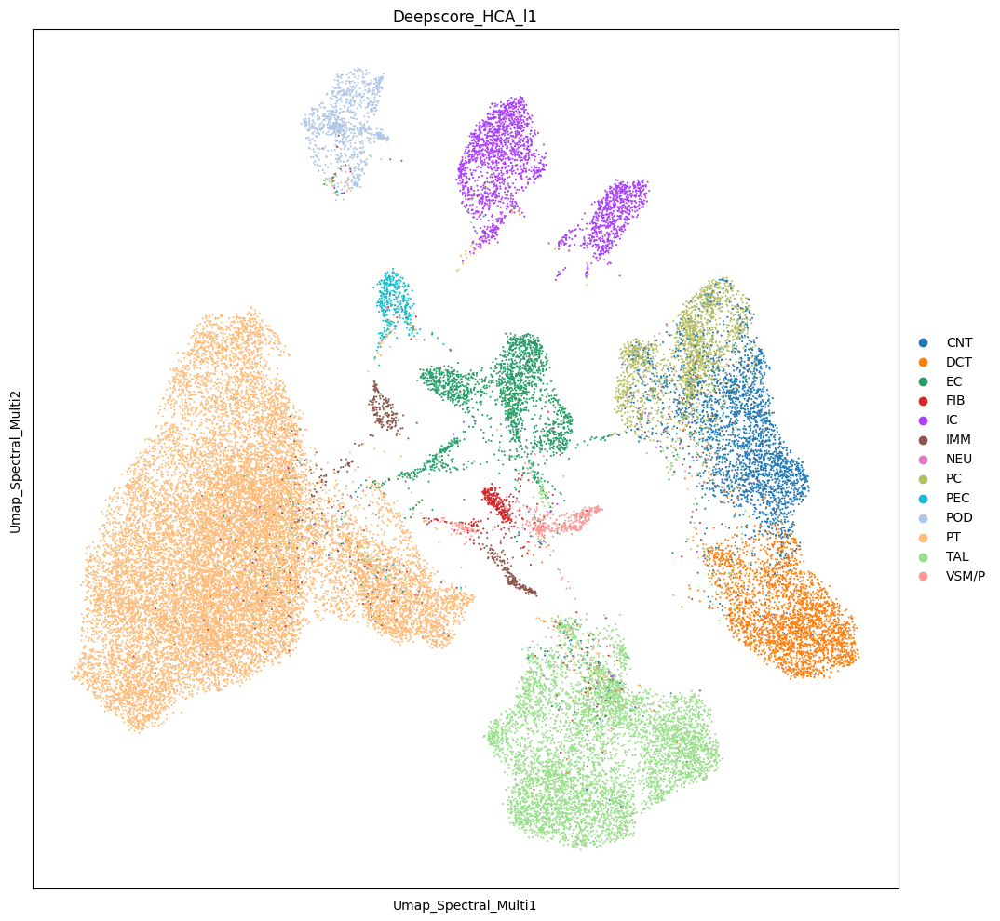

In [66]:
sc.pl.embedding(adata, basis='Umap_Spectral_Multi',size=9, color = 'Deepscore_HCA_l1')

In [139]:
import numpy as np

def to_numeric(value):
    try:
        return float(value)  # Attempt to convert to float
    except (ValueError, TypeError):
        return np.nan  # Replace invalid values with NaN
for key in adata.obsm.keys():
    adata.obsm[key] = np.array([[to_numeric(v) for v in row] for row in adata.obsm[key]])


In [141]:
# adata.obsm = {str(key): value for key, value in adata.obsm.items()}
adata.write('../FINAL_DATA/snRNA.h5ad')

In [89]:
import numpy as np

for key in list(adata.obsm.keys()):
    value = adata.obsm[key]
    if not isinstance(value, np.ndarray):
        try:
            # Try converting to a NumPy array
            adata.obsm[key] = np.array(value)
        except Exception as e:
            print(f"Error converting {key}: {e}")
            del adata.obsm[key] 

In [45]:
sc.pl.embedding(mosaic_int, basis='Umap_Spectral_Multi',size=9, color = 'Deepscore_HCA_l1_Clean')

KeyError: "Could not find 'Umap_Spectral_Multi' or 'X_Umap_Spectral_Multi' in .obsm"

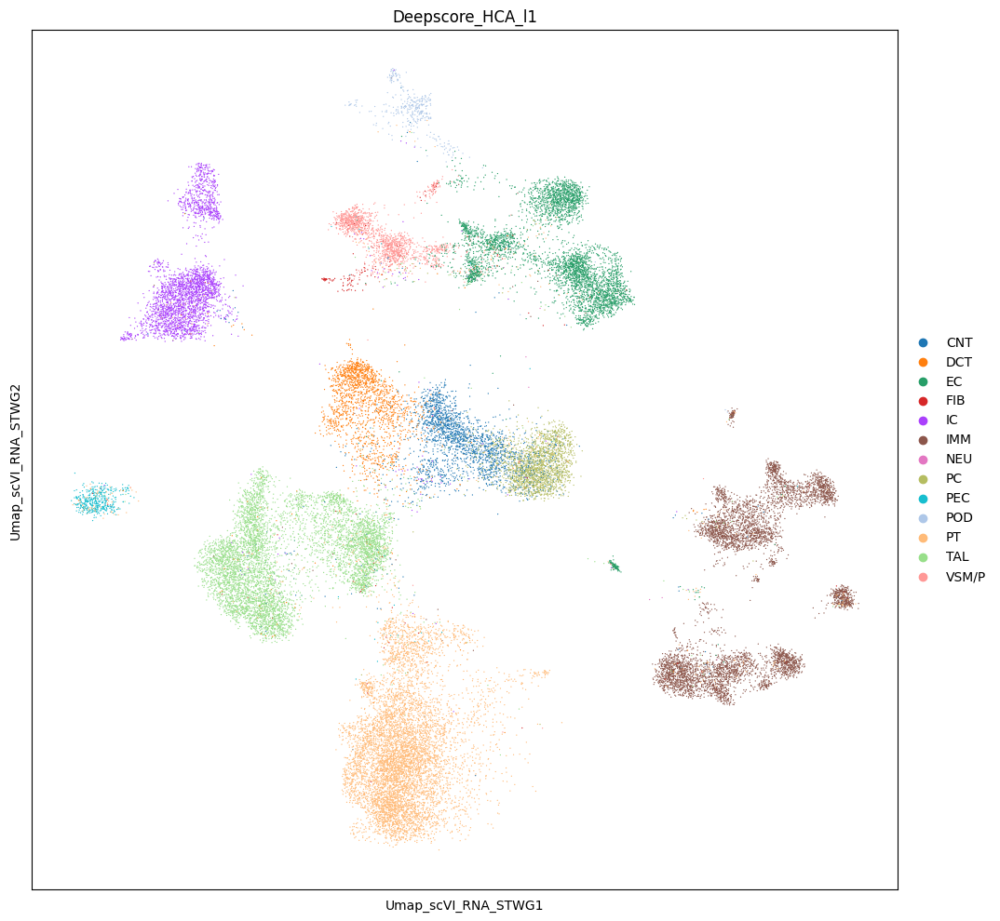

In [88]:
sc.pl.embedding(adata, basis='Umap_scVI_RNA_STWG', color = 'Deepscore_HCA_l1')

In [ ]:
for key in adata.obsm.keys():
    adata

Harmony
Scanorama
Umap_Harmony
Umap_Scanorama
Umap_Unintegrated
Umap_scVI
Unintegrated
X_pca
X_umap
scVI


AnnData object with n_obs × n_vars = 119744 × 55000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1'

In [ ]:
adata

AnnData object with n_obs × n_vars = 119744 × 55000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1'

In [ ]:
for col in metadata.columns:
    meta_l = [metadata.loc[i,col] for i in adata.obs['sample']]
    adata.obs[col] = meta_l
    adata.obs[col] = adata.obs[col].astype('category')

In [ ]:
adata.obs['sex']

AAACCAACAGAAATGC-9-snMulti_paired              male
AAACCGGCACCTAATG-2-snMulti_paired              male
AAACGCGCAGCAACCT-5-snMulti_paired            female
AAAGCCGCAGCTTACA-9-snMulti_paired              male
AAAGCTTGTAACCTAG-9-snMulti_paired              male
                                              ...  
TTTGTTGGTTAGAGCC-13-snMulti_accessibility      male
TTTGTTGGTTCCGGCT-13-snMulti_accessibility      male
TTTGTTGGTTTAGTCC-13-snMulti_accessibility      male
TTTGTTGGTTTATTCG-6-snMulti_accessibility       male
TTTGTTGGTTTCCTCC-7-snMulti_accessibility     female
Name: sex, Length: 119744, dtype: category
Categories (2, object): ['female', 'male']

In [14]:
atac_ann = pd.read_csv('../DEEPSCORE/csv/atac_unpaired_annotations.csv', index_col=0)
atac_ann.index = [i+'-snMulti_accessibility' for i in atac_ann.index]
atac_ann = atac_ann[atac_ann.index.isin(adata.obs.index)]
adata.obs['Deepscore_HCA_l1_Clean'] = adata.obs['Deepscore_HCA_l1_Clean'].tolist()
adata.obs['Deepscore_HCA_l3_Clean'] = adata.obs['Deepscore_HCA_l3_Clean'].tolist()
adata.obs.loc[atac_ann.index,'Deepscore_HCA_l1_Clean'] = atac_ann['deepscore_L1_full_annot']
adata.obs.loc[atac_ann.index,'Deepscore_HCA_l3_Clean'] = atac_ann['deepscore_L2_ver3_full_annot']

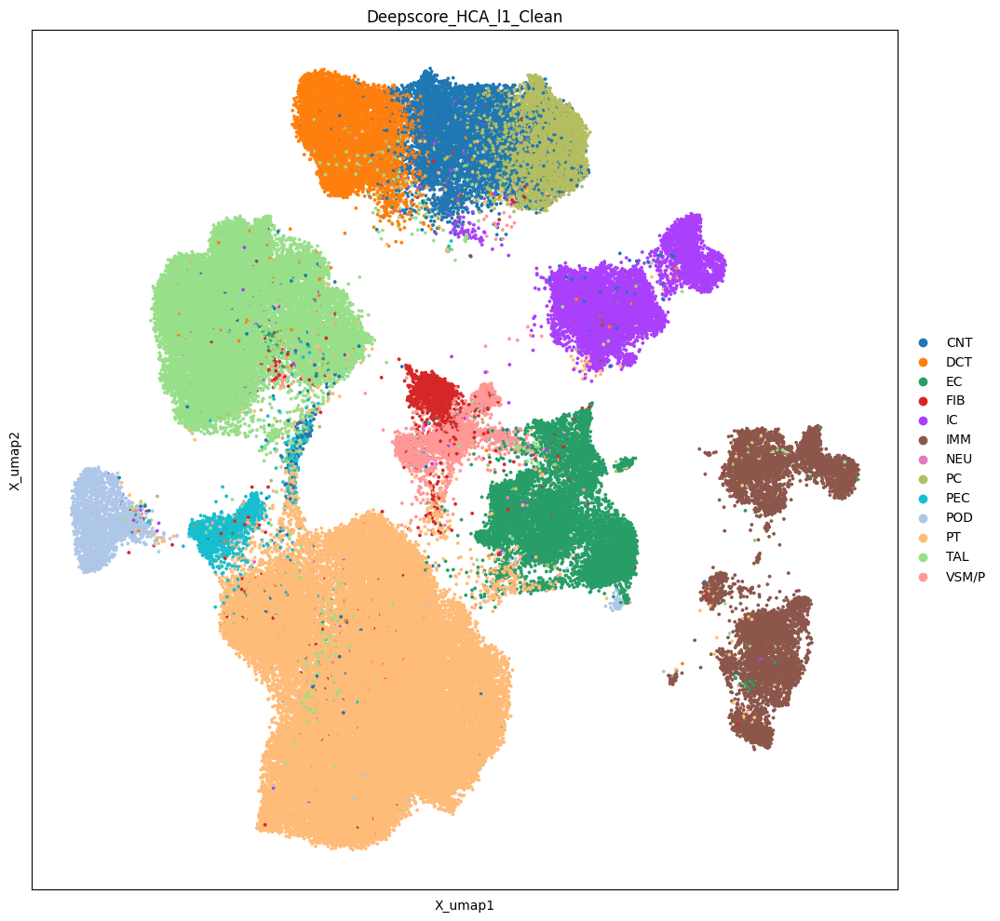

In [15]:
sc.pl.embedding(adata, basis = 'X_umap', color = 'Deepscore_HCA_l1_Clean', size = 30)

In [18]:
batch_sample_counts = adata.obs.groupby('batch')['sample'].nunique()

# Display the results
print(batch_sample_counts)

batch
scRNA      18
scRNA5p     4
snATAC     11
snMulti    10
snRNA      10
Name: sample, dtype: int64


In [110]:
color_dict = {
    'Global RNA Horizontal': '#d62728',
    "scRNA 3'": '#1f77b4',
    "scRNA 5'": '#ff7f0e',
    'scMultiome-RNA': '#2ca02c',
    'scMultiome-ATAC': '#8c564b', 
    'scMultiome-Paired': '#000000',
    'Global Multimodal Mosaic': '#e377c2',
    'Global Multimodal Diagonal': '#17becf'
}

In [ ]:
color_dict = {
    'Global RNA Horizontal': '#d62728',
    "scRNA 3p": '#1f77b4',
    "scRNA 5p": '#ff7f0e',
    'snRNA': '#2ca02c',
    'snATAC': '#8c564b', 
    'scMulti': '#000000',
    'Global Multimodal Mosaic': '#e377c2',
    'Global Multimodal Diagonal': '#17becf'
}
rename_dict = {'scRNA': "scRNA 3p", 'scRNA5p': "scRNA 5p", 'snRNA':  'snRNA',
    'snATAC':'snATAC', 'snMulti':'snMulti',}
adata.obs['batch'] = adata.obs['batch'].replace(rename_dict)

/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


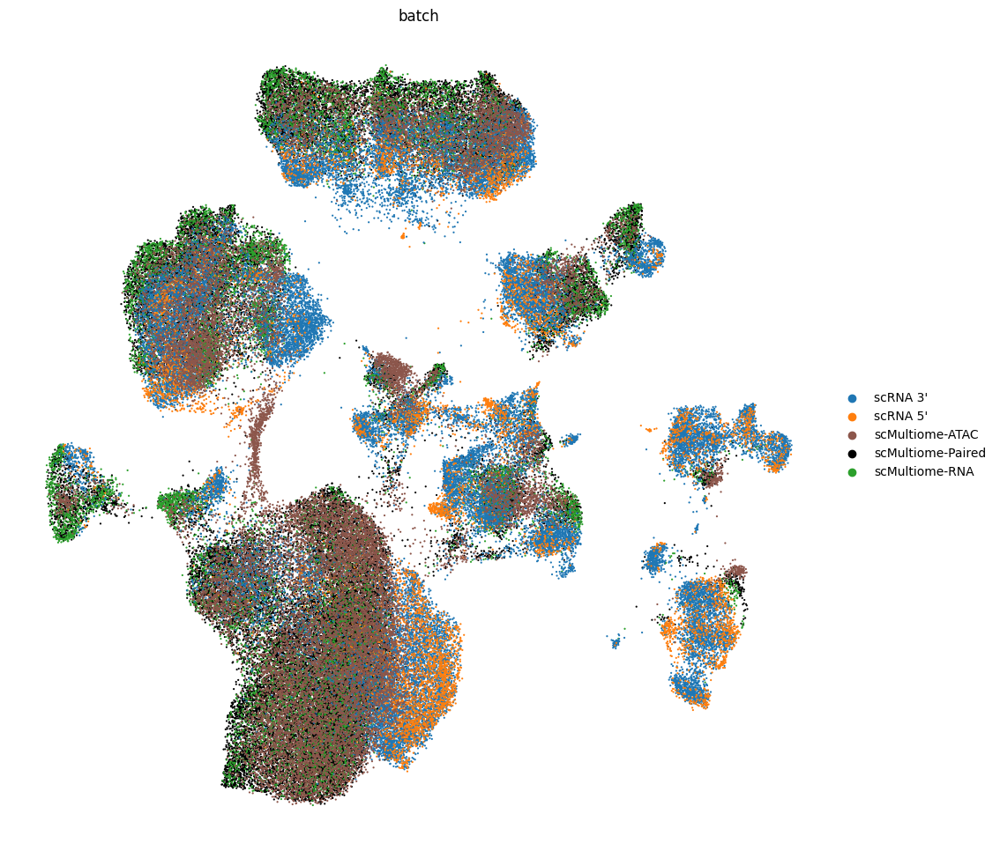

In [112]:
sc.pl.umap(adata, color = 'batch',palette = color_dict, size = 10, frameon=False, show=False)
plt.savefig('figures/MultiVI_batch.png', dpi = 300, bbox_inches = 'tight')

In [8]:
rcParams['figure.figsize'] = (6,6)

for meta in ['batch']:
    for cat in adata.obs[meta].unique():
        print(cat)
        try:
            sc.pl.embedding(adata, basis='X_umap', color = meta, frameon = False, show=False, palette = color_dict, groups=cat, size = 3)
            meta_ = meta.replace('/','')
            plt.savefig(f'figures/metadata/{meta_}_{cat}.png', dpi = 300, bbox_inches='tight')
        except:
            print('Meh')

KeyError: 'sex'

lib_51


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_10


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_29


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_09


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_36


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_55


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_15


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_34


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_57


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_56


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_16


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_420


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_20


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_03


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_19


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_68


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_49


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_38


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


lib_54


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


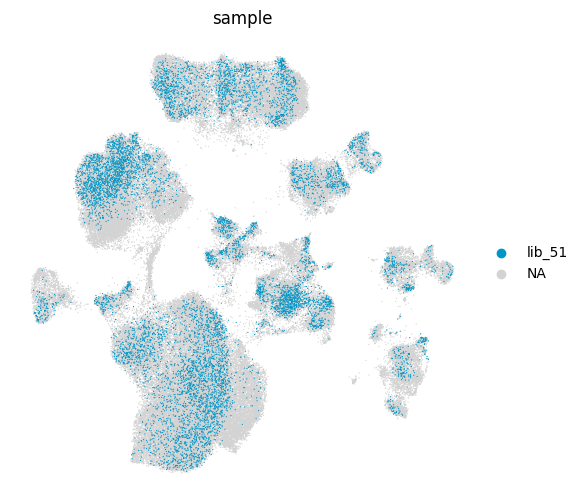

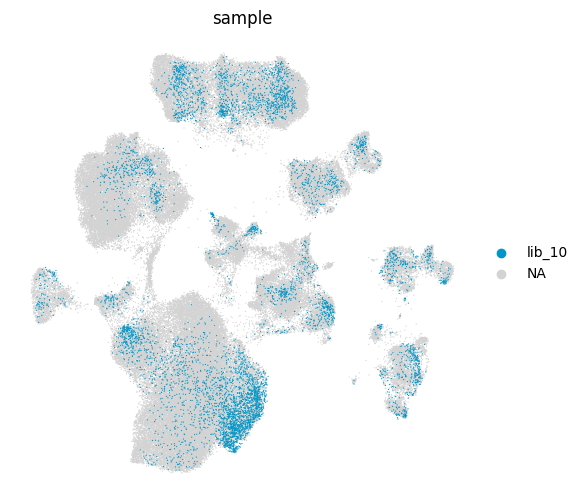

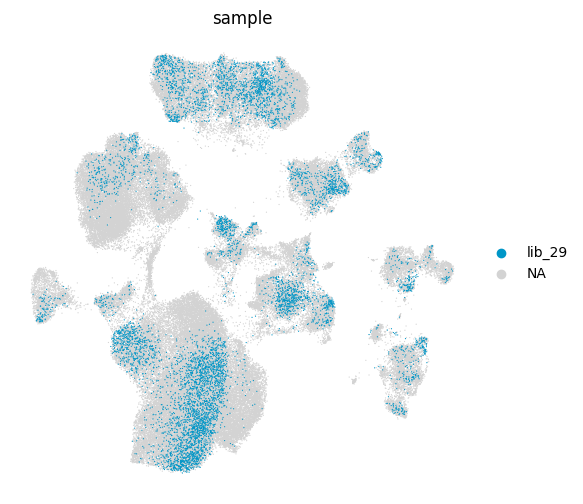

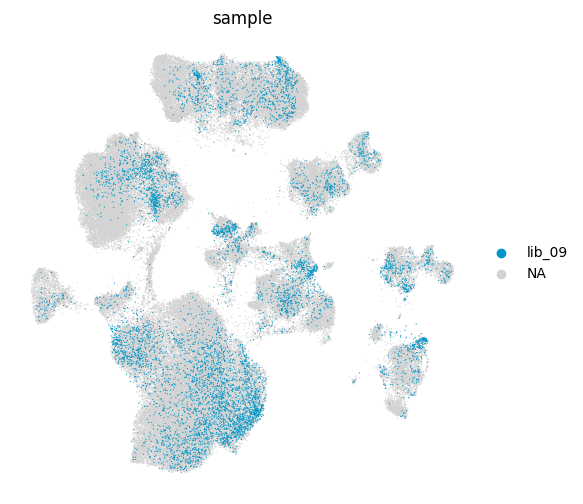

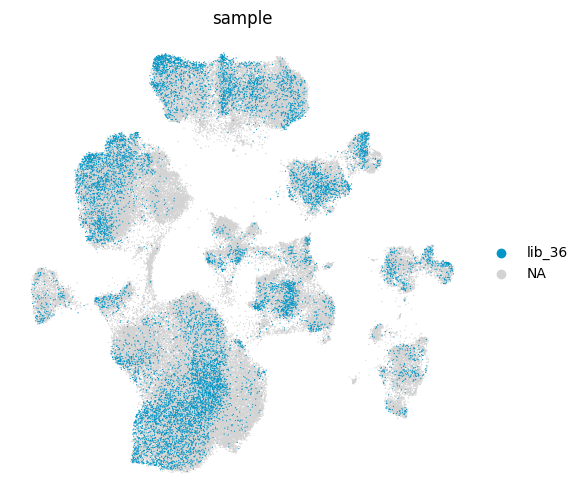

...

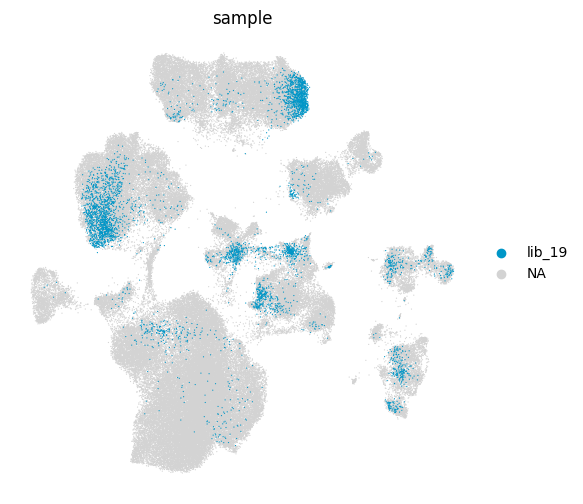

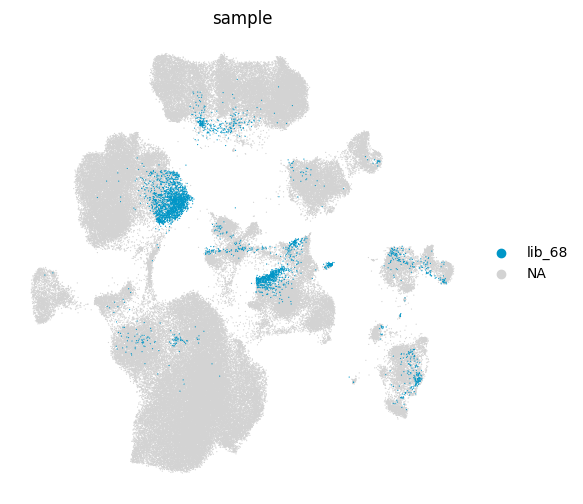

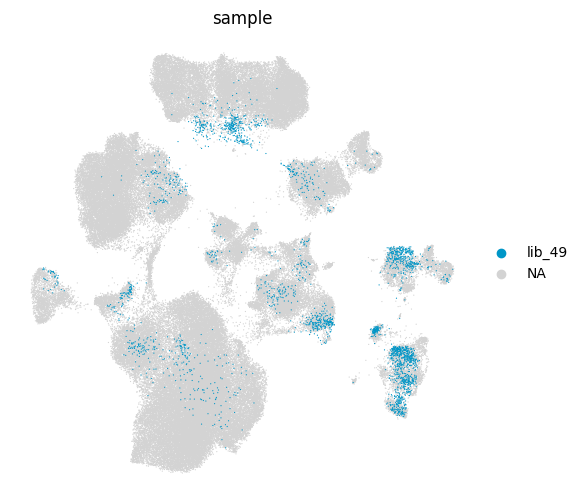

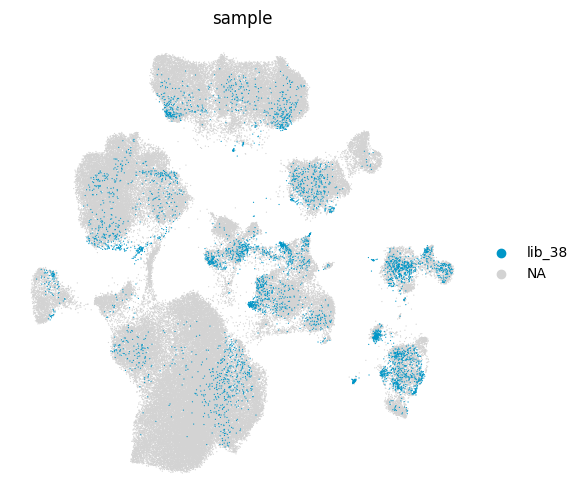

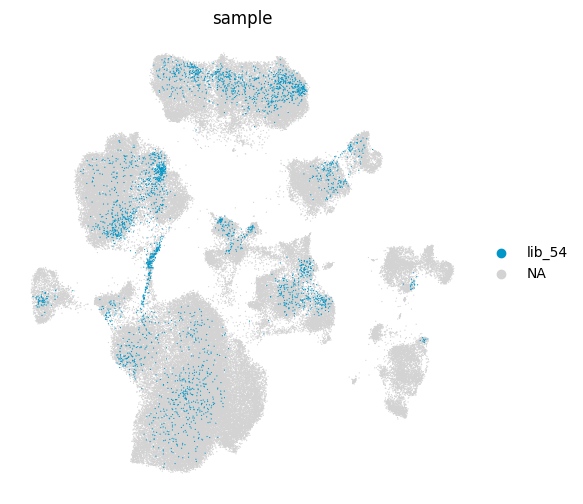

In [116]:
rcParams['figure.figsize'] = (6,6)

for meta in ['sample']:
    for cat in adata.obs[meta].unique():
        print(cat)
        try:
            sc.pl.embedding(adata, basis='X_umap', color = meta, frameon = False, show=False, palette = ['#0096C7'], groups=cat, size = 3)
            meta_ = meta.replace('/','')
            plt.savefig(f'figures/metadata/{meta_}_{cat}.png', dpi = 300, bbox_inches='tight')
        except:
            print('Meh')

In [40]:
adata = adata[~adata.obs['Deepscore_HCA_l1_Clean'].isin([pd.NA,'NEU'])]
# adata = adata[~adata.obs['Deepscore_HCA_l1_Clean'].isin([])]

Figure size= (6, 6) dpi= 100.0 Scale factor = 18.66211720923831


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


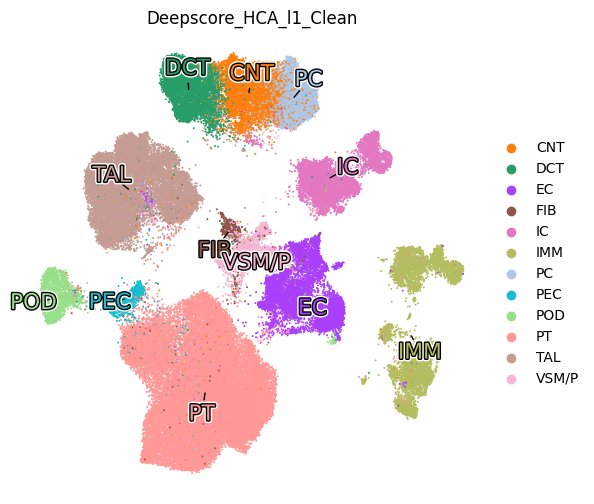

In [57]:
latent = 'MultiVI'
for ann in ['Deepscore_HCA_l1_Clean']:
    adata.uns[f'{ann}_colors'] = [l1_colors[i] for i in adata.obs[ann].cat.categories]
    umap_refined(adata,
                umap = f'X_umap',
                var = ann,
                size= 8,
                label_size = 15 * (50/len(adata.obs[ann].unique())),
                width_in_inches = 6,
                height_in_inches = 6,
                max_iterations=100)
    # plt.savefig(f'../DEEPSCORE/figures/umaps/{ann}.png',  bbox_inches='tight', dpi=300)
    plt.savefig(f'figures/UMAP_{ann}_{latent}_small.png',  bbox_inches='tight', dpi=300)

Figure size= (14, 14) dpi= 100.0 Scale factor = 43.54494015488939


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


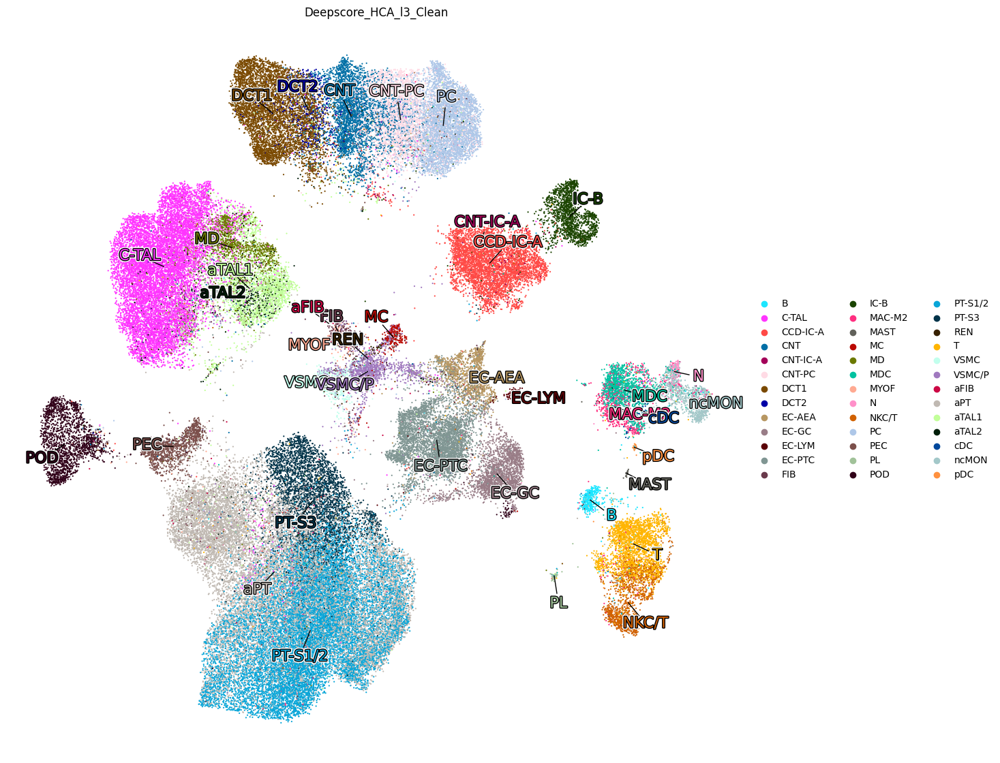

In [79]:
latent = 'MultiVI'
for ann in ['Deepscore_HCA_l3_Clean']:
    adata.uns[f'{ann}_colors'] = [l3_colors[i] for i in adata.obs[ann].cat.categories]
    umap_refined(adata,
                umap = f'X_umap',
                var = ann,
                size= 10,
                label_size = 50 * (50/len(adata.obs[ann].unique())),
                width_in_inches = 14,
                height_in_inches = 14,
                max_iterations=10)
    # plt.savefig(f'../DEEPSCORE/figures/umaps/{ann}.png',  bbox_inches='tight', dpi=300)
    plt.savefig(f'figures/UMAP_{ann}_{latent}_big.png',  bbox_inches='tight', dpi=300)
    plt.savefig(f'figures/UMAP_{ann}_{latent}_big.svg',  bbox_inches='tight', dpi=200)

# ADDING SMAPLE METADATA

In [9]:
adata

AnnData object with n_obs × n_vars = 119744 × 55000
    obs: 'sample', 'batch', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rb', 'pct_counts_rb', 'Deepscore_external', 'Doublet_Detection_doublets_scRNA', 'Doublet_Detection_doublets_score_scRNA', 'Doublet_Detection_doublets_scRNA5p', 'Doublet_Detection_doublets_score_scRNA5p', 'AMULET_doublets', 'AMULET_pval', 'AMULET_qval', 'Doublet_Detection_doublets_snRNA', 'Doublet_Detection_doublets_score_snRNA', 'In_final_obj', 'Deepscore', 'Technology', 'Suspension_type', 'Study', 'Donor_id', 'Deepscore_HCA_l1_Clean', 'Deepscore_HCA_l1_full', 'Deepscore_HCA_l1_Clean_score', 'Deepscore_HCA_l1_Full', 'Deepscore_HCA_l1_Full_score', 'Deepscore_HCA_l3_Clean', 'Deepscore_HCA_l3_Clean_score', 'Deepscore_HCA_l3_Full', 'Deepscore_HCA_l3_Full_score', 'Deepscore_Muto', 'Deepscore_Muto_score', 'leiden_scVI_0.3', 'leiden_scVI_1.4', 'leiden_scVI_2', 'leiden_scVI_6', 'leiden_scVI_10', 'Manual_Annotation_l1'

In [10]:
metadata = pd.read_excel('../CZI-HCA_PRECISE-samples_Metadata_110223.xlsx')
metadata = metadata.dropna()

In [11]:
index = [f'lib_{int(i)}' for i in metadata['precise_ID']]
index[0] = 'lib_09'
metadata.index = index
metadata

,precise_ID,description,sex,age,Race,Hispanic_No_Yes,Kidney,BMI,Height (cm),Weight (kg),living_at_collection,SCr (mg/dl),eGFR (ml/min/1.73m2),Diabetes_No-0_Yes-1,Hypertension_No-0_Yes-1
lib_09,9.0,Normal Tissue from Tumor Nephrectomy,male,72.0,White,0.0,Right,23.89,190.5,86.7,Yes,1.13,69.0,1.0,1.0
lib_10,10.0,Normal Tissue from Tumor Nephrectomy,male,68.0,White,0.0,Right,35.02,181.6,115.5,Yes,1.48,51.0,1.0,1.0
lib_15,15.0,Normal Tissue from Tumor Nephrectomy,female,57.0,White,0.0,Right,21.08,167.6,59.2,Yes,0.54,138.0,0.0,0.0
lib_23,23.0,Normal Tissue from Tumor Nephrectomy,male,67.0,White,0.0,Right,32.99,185.4,113.4,Yes,1.10,74.0,0.0,1.0
lib_29,29.0,Normal Tissue from Tumor Nephrectomy,female,50.0,White,0.0,Right,56.99,160.0,145.9,Yes,0.60,127.0,1.0,1.0
lib_36,36.0,Normal Tissue from Tumor Nephrectomy,female,53.0,White,0.0,Right,29.39,162.6,77.7,Yes,0.85,82.0,0.0,0.0
lib_51,51.0,Normal Tissue from Tumor Nephrectomy,male,67.0,White,0.0,Left,32.55,182.9,108.9,Yes,1.47,52.0,0.0,0.0
lib_54,54.0,Normal Tissue from Tumor Nephrectomy,male,74.0,White,0.0,Left,33.02,168.9,94.2,Yes,1.11,70.0,0.0,1.0
lib_55,55.0,Normal Tissue from Tumor Nephrectomy,female,68.0,White,0.0,Left,44.08,165.0,120.0,Yes,0.77,84.0,0.0,1.0
lib_56,56.0,Normal Tissue from Tumor Nephrectomy,male,59.0,White,0.0,Right,27.56,179.8,89.1,Yes,0.90,98.0,0.0,1.0


In [12]:
for sample in adata.obs['sample'].unique():
    if sample not in metadata.index:
        metadata.loc[sample]=None

/tmp/ipykernel_6055/2142144921.py:3: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  metadata.loc[sample]=None
/tmp/ipykernel_6055/2142144921.py:3: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  metadata.loc[sample]=None
/tmp/ipykernel_6055/2142144921.py:3: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  metadata.loc[sample]=None
/tmp/ipykernel_6055/2142144921.py:3: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  metadata.loc[sample]=None


In [13]:
for col in metadata.columns:
    meta_l = [metadata.loc[i,col] for i in adata.obs['sample']]
    adata.obs[col] = meta_l
    adata.obs[col] = adata.obs[col].astype('category')

In [16]:
adata.obs['sex']

AAACCAACAGAAATGC-9-snMulti_paired              male
AAACCGGCACCTAATG-2-snMulti_paired              male
AAACGCGCAGCAACCT-5-snMulti_paired            female
AAAGCCGCAGCTTACA-9-snMulti_paired              male
AAAGCTTGTAACCTAG-9-snMulti_paired              male
                                              ...  
TTTGTTGGTTAGAGCC-13-snMulti_accessibility      male
TTTGTTGGTTCCGGCT-13-snMulti_accessibility      male
TTTGTTGGTTTAGTCC-13-snMulti_accessibility      male
TTTGTTGGTTTATTCG-6-snMulti_accessibility       male
TTTGTTGGTTTCCTCC-7-snMulti_accessibility     female
Name: sex, Length: 119744, dtype: category
Categories (2, object): ['female', 'male']

male


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


female


/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


nan
Meh


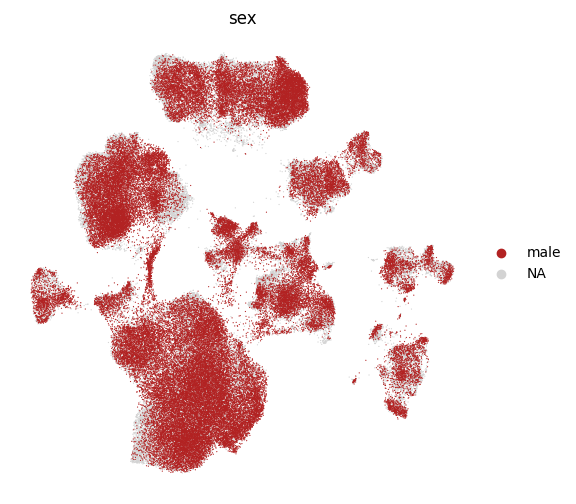

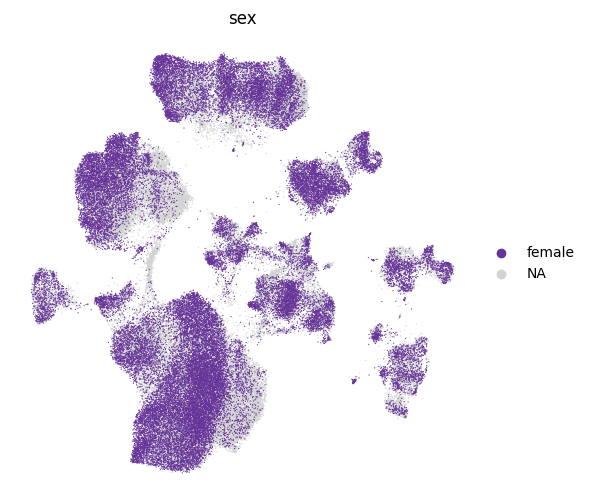

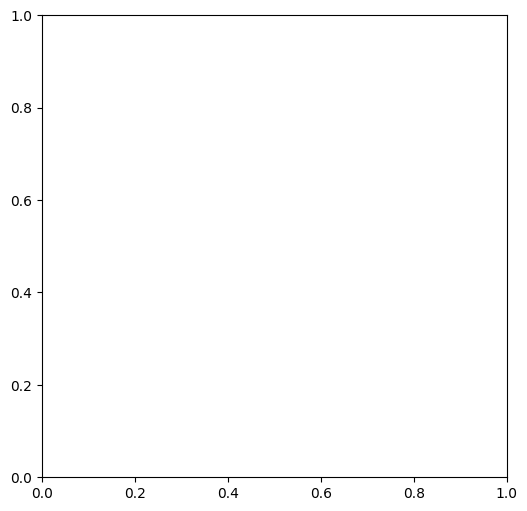

In [19]:
rcParams['figure.figsize'] = (6,6)

for meta in ['sex']:
    for cat in adata.obs[meta].unique():
        print(cat)
        try:
            sc.pl.embedding(adata, basis='X_umap', color = meta, frameon = False, show=False, palette = {'male':'firebrick', 'female':'rebeccapurple'}, groups=cat, size = 3)
            meta_ = meta.replace('/','')
            plt.savefig(f'figures/metadata/{meta_}_{cat}.png', dpi = 300, bbox_inches='tight')
        except:
            print('Meh')

/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/macera/.conda/envs/scanpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via '

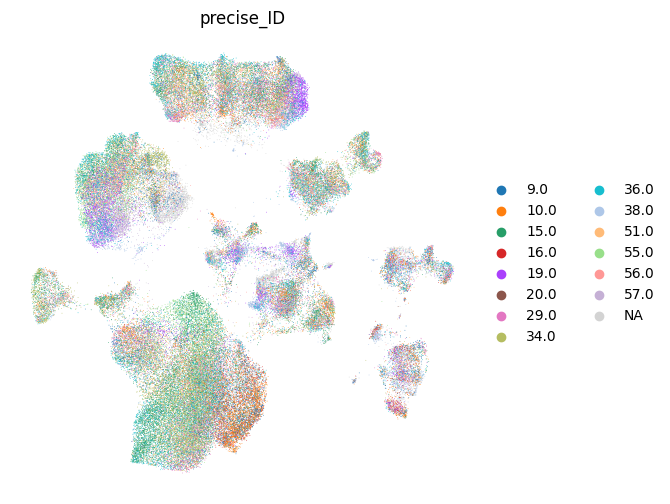

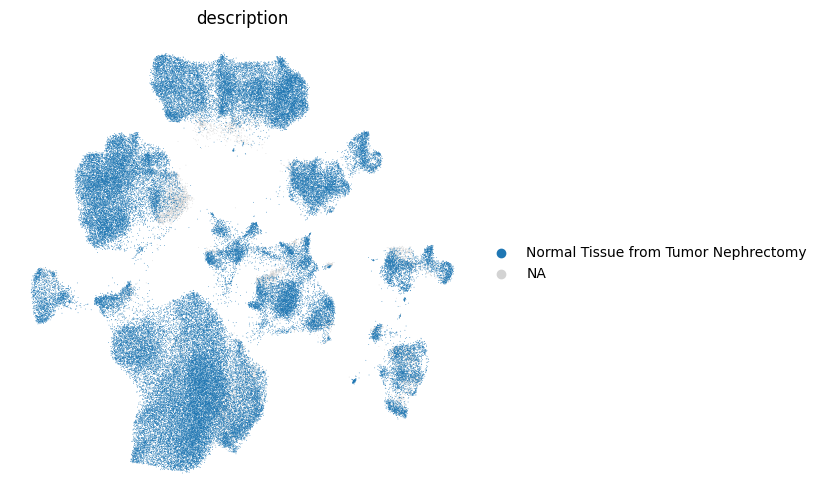

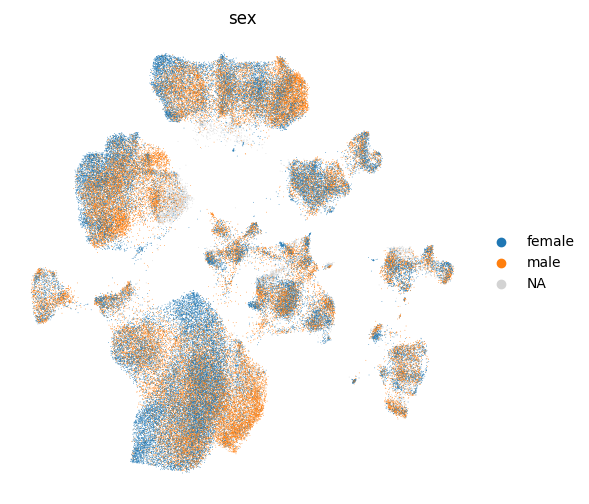

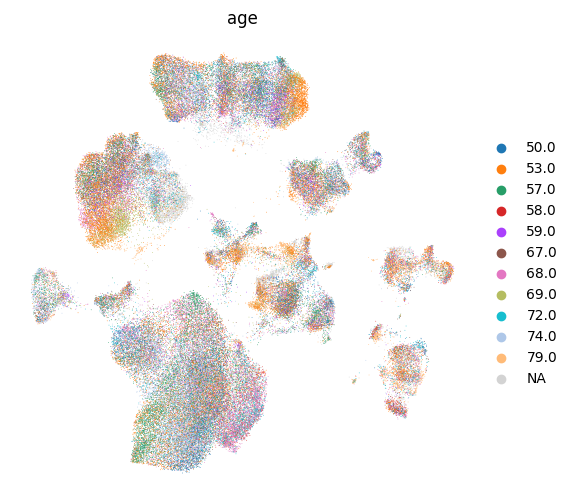

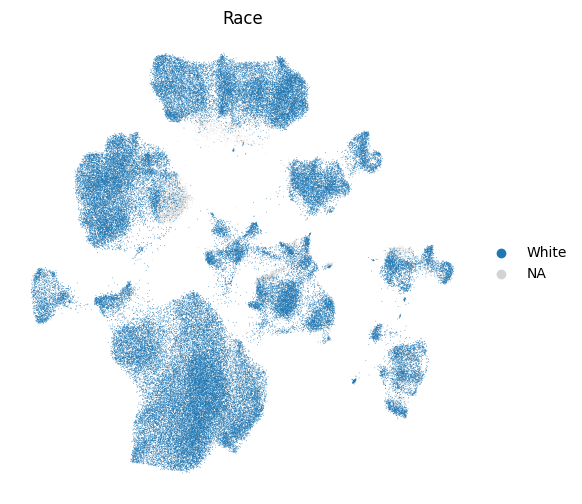

...

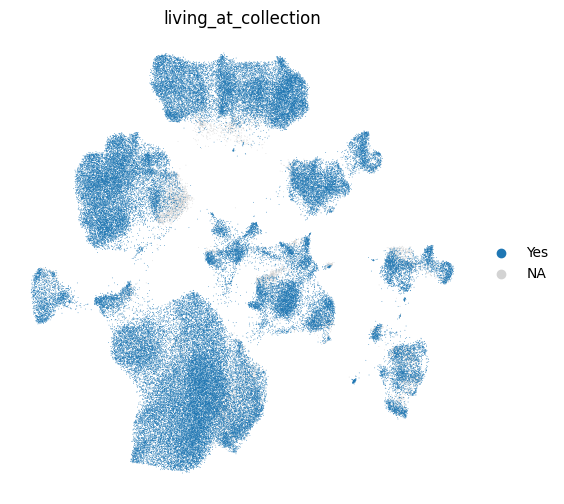

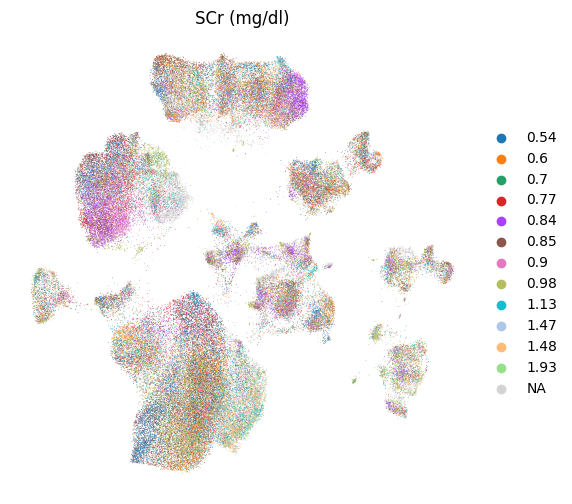

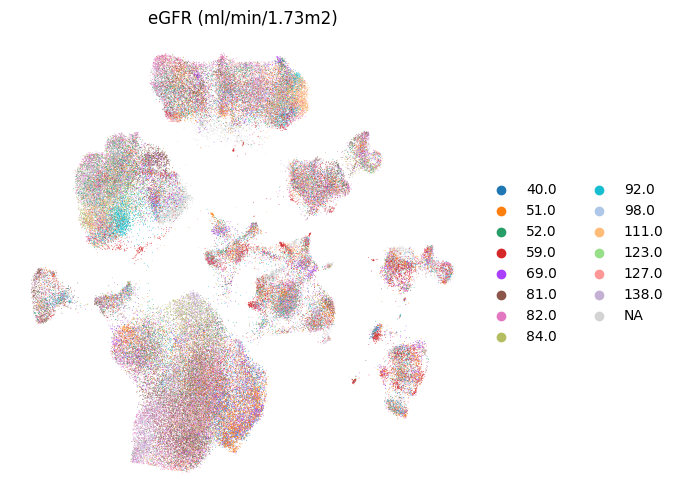

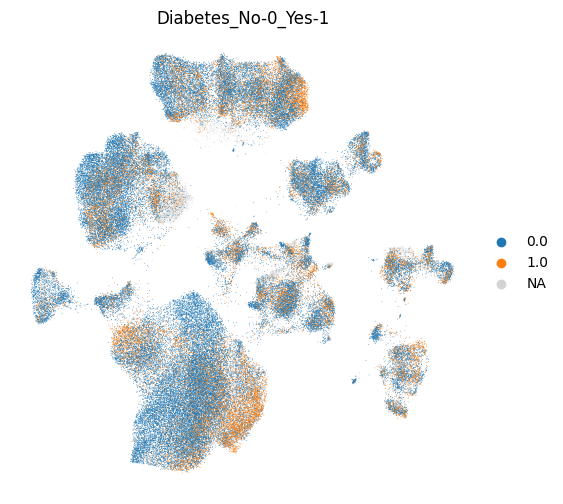

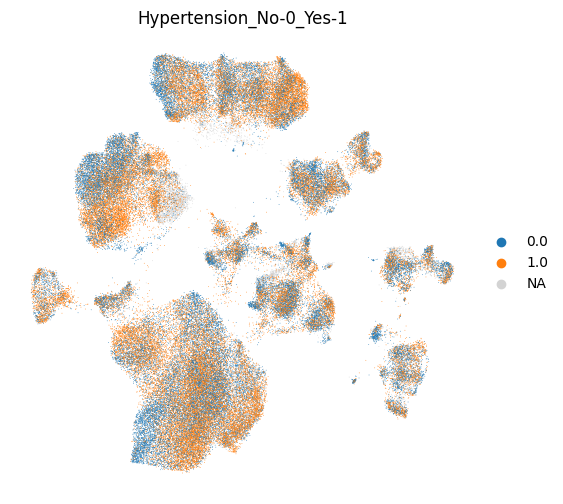

In [80]:
rcParams['figure.figsize'] = (6,6)
for meta in metadata.columns:
    sc.pl.embedding(adata, basis='X_umap', color = meta, frameon = False, show=False)
    meta_ = meta.replace('/','')
    plt.savefig(f'figures/metadata/{meta_}.png', dpi = 300, bbox_inches='tight')

# Plotting BATCHES

In [81]:
metadata.columns

Index(['precise_ID', 'description', 'sex', 'age', 'Race', 'Hispanic_No_Yes',
       'Kidney', 'BMI', 'Height (cm)', 'Weight (kg)', 'living_at_collection',
       'SCr (mg/dl)', 'eGFR (ml/min/1.73m2)', 'Diabetes_No-0_Yes-1',
       'Hypertension_No-0_Yes-1'],
      dtype='object')

In [98]:
adata.obs['Hypertension'] = adata.obs['Hypertension_No-0_Yes-1'].astype('category')
adata.obs['Diabetes'] = adata.obs['Diabetes_No-0_Yes-1'].astype('category')
adata.obs['sex'] = adata.obs['sex']
adata.obs['age'] = adata.obs['age'].astype(float)
adata.obs['Kidney'] = adata.obs['Kidney']
adata.obs['eGFR'] = adata.obs['eGFR (ml/min/1.73m2)'].astype(float)
adata.obs['SCr'] = adata.obs['SCr (mg/dl)'].astype(float)
adata.obs['Height (cm)'] = adata.obs['Height (cm)'].astype(float)
adata.obs['Weight (kg)'] = adata.obs['Weight (kg)'].astype(float)


In [82]:
adata.obs['sex']

AAACCAACAGAAATGC-9-snMulti_paired            male
AAACCGGCACCTAATG-2-snMulti_paired            male
AAACGCGCAGCAACCT-5-snMulti_paired          female
AAAGCCGCAGCTTACA-9-snMulti_paired            male
AAAGCTTGTAACCTAG-9-snMulti_paired            male
                                            ...  
TTTCCTCTCGGAAACG-1-3-scRNA5p_expression      male
TTTGCGCAGTGGCACA-1-3-scRNA5p_expression      male
TTTGGTTCAATCCGAT-1-3-scRNA5p_expression      male
TTTGGTTTCAAAGTAG-1-3-scRNA5p_expression      male
TTTGTCAGTCACAAGG-1-3-scRNA5p_expression      male
Name: sex, Length: 97095, dtype: category
Categories (2, object): ['female', 'male']

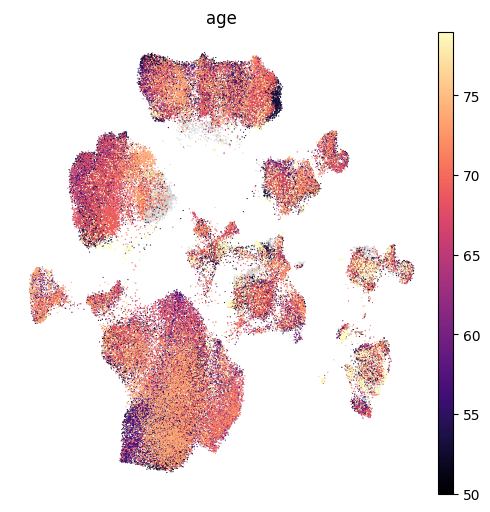

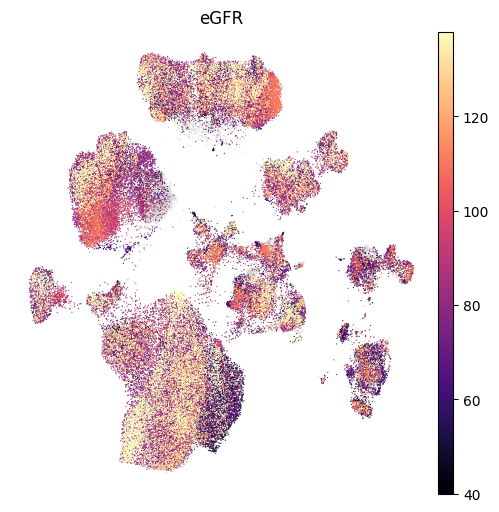

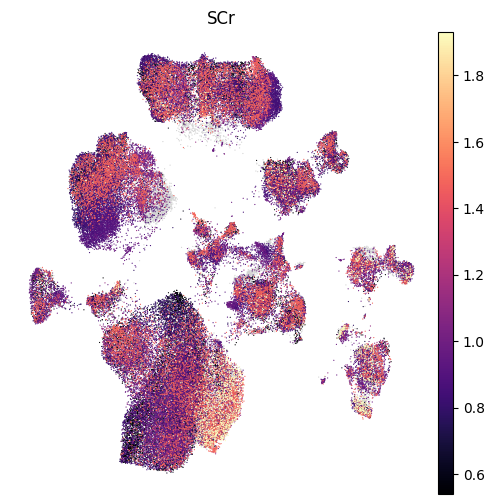

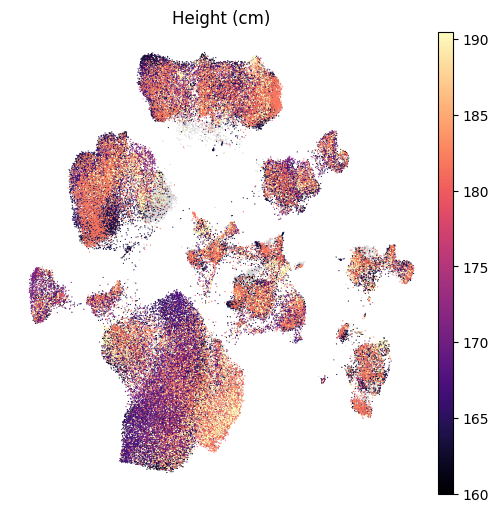

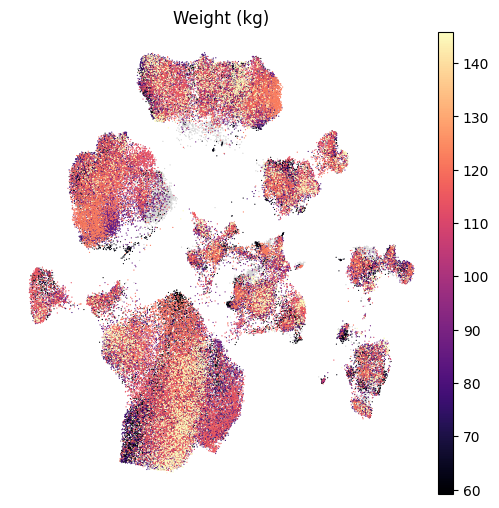

In [99]:
for meta in ['age','eGFR','SCr','Height (cm)','Weight (kg)']:

    try:
        sc.pl.embedding(adata, basis='X_umap', color = meta, frameon = False, show=False,  size = 3, cmap = 'magma')
        meta_ = meta.replace('/','')
        plt.savefig(f'figures/metadata/{meta_}_{cat}.png', dpi = 300, bbox_inches='tight')
    except:
        print('Meh')

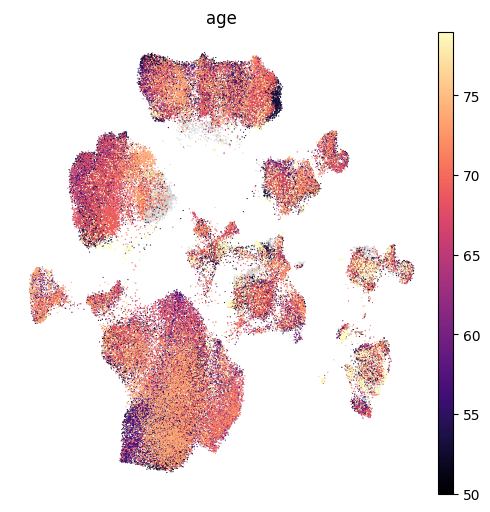

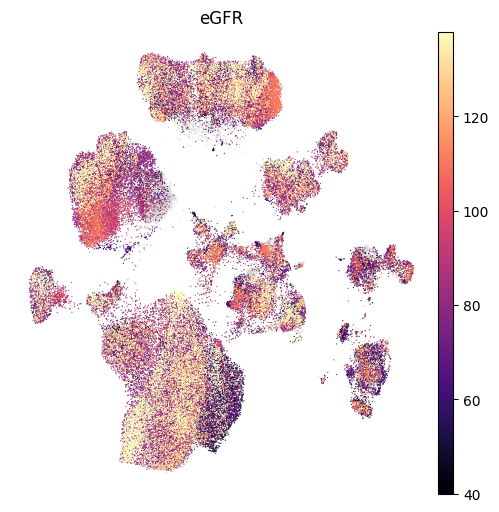

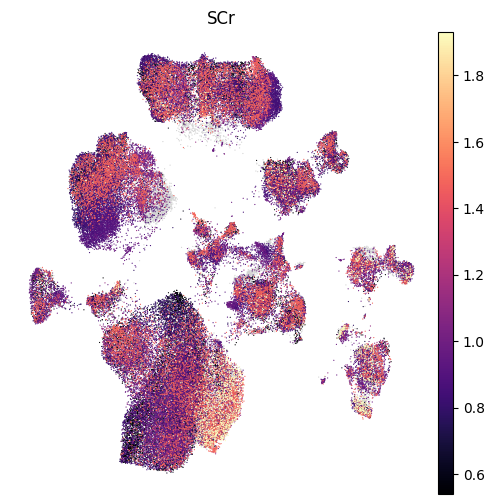

In [ ]:
for meta in ['age','eGFR','SCr','Height (cm)','Weight (kg)']:

    try:
        sc.pl.embedding(adata, basis='X_umap', color = meta, frameon = False, show=False,  size = 3, cmap = 'magma')
        meta_ = meta.replace('/','')
        plt.savefig(f'figures/metadata/{meta_}_{cat}.png', dpi = 300, bbox_inches='tight')
    except:
        print('Meh')